In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from itertools import combinations
import lightgbm as lgb

# Part 1. EDA

In [3]:
# get filepaths
all_filepaths = glob.glob("../data/*.npz")
all_filepaths = sorted(all_filepaths)
all_filenames = [os.path.basename(all_filepaths[i]) for i in range(len(all_filepaths))]

In [4]:
# get data for all labeled images
os.chdir("../data")
filepaths = ['O013257.npz', 'O013490.npz', 'O012791.npz']
images_long = []
for fp in filepaths:
    npz_data = np.load(fp)
    key = list(npz_data.files)[0]
    data = npz_data[key]
    #if data.shape[1] == 11:
    #    data = data[:, :-1]  # remove labels
    images_long.append(data)

In [5]:
# get image numbers
image_numbers = [all_filenames.index(filepaths[i]) + 1 for i in range(len(filepaths))]

## 1.1. Expert Labels

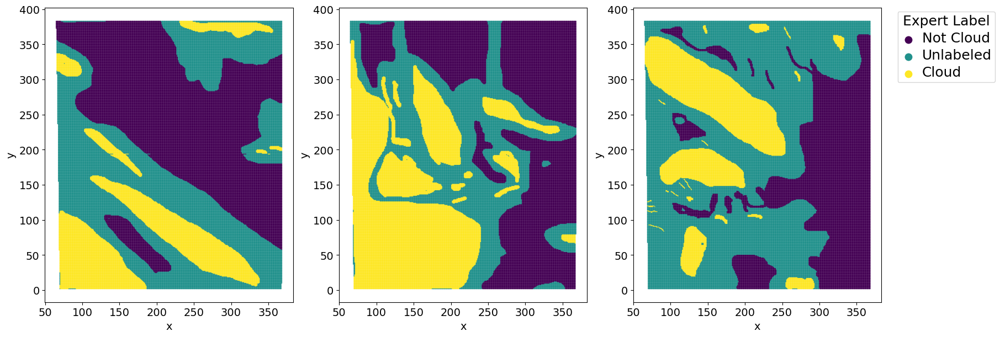

<Figure size 640x480 with 0 Axes>

In [6]:
# each row pixel
# each column feature
# 1: cloud, 0: unlabeled, -1: cloud
# plot expert labels at each coordinate
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)
axes = axes.flatten()
for i in range(len(images_long)):
    data = images_long[i]
    y_coor = data[:, 0]
    x_coor = data[:, 1]
    label = data[:, 10]
    df = pd.DataFrame(np.stack((y_coor, x_coor, label), axis=1))
    df.columns = ['y', 'x', 'label']
    g = sns.scatterplot(data=df, x='x', y='y', hue='label', marker='.', palette='viridis', s=7, linewidth=0, ax=axes[i])
    g.legend([],[], frameon=False)
    if i == 2:
        g.legend_.set_title("Cloud Label")
        handles, labels = g.get_legend_handles_labels()
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Unlabeled", "Cloud"], title="Expert Label", title_fontsize=18)
        for lh in g.legend_.legend_handles: 
            lh.set_alpha(1)
            lh.set_markersize(20) 
        for text in g.legend_.get_texts():
            text.set_fontsize(18)  
    axes[i].set_xlabel('x', fontsize=14)
    axes[i].set_ylabel('y', fontsize=14)
    axes[i].tick_params(axis='both', labelsize=14)  # Adjust axis tick size
plt.show()
plt.savefig('../figs/expert_label.png');

In [7]:
# store data in dataframe
labeled1 = pd.DataFrame(images_long[0])
labeled1.columns = ['y', 'x', 'NDAI', 'SD', 'CORR', 'Radiance Angle DF',
                      'Radiance Angle CF', 'Radiance Angle BF', 
                      'Radiance Angle AF', 'Radiance Angle AN', 'Expert Label']
labeled2 = pd.DataFrame(images_long[1])
labeled2.columns = ['y', 'x', 'NDAI', 'SD', 'CORR', 'Radiance Angle DF',
                      'Radiance Angle CF', 'Radiance Angle BF', 
                      'Radiance Angle AF', 'Radiance Angle AN', 'Expert Label']
labeled3 = pd.DataFrame(images_long[2])
labeled3.columns = ['y', 'x', 'NDAI', 'SD', 'CORR', 'Radiance Angle DF',
                      'Radiance Angle CF', 'Radiance Angle BF', 
                      'Radiance Angle AF', 'Radiance Angle AN', 'Expert Label']

## 1.2. Exploring relationship between features

In [8]:
# get entire dataset with labels
image_data = pd.concat([labeled1, labeled2, labeled3])
image_data

,y,x,NDAI,SD,CORR,Radiance Angle DF,Radiance Angle CF,Radiance Angle BF,Radiance Angle AF,Radiance Angle AN,Expert Label
0,2.0,70.0,0.528076,1820.998779,0.900904,22692.50,19834.00,11228.50,8536.50,7008.25,0.0
1,2.0,71.0,0.593831,1169.416504,0.473416,23461.00,18388.50,11575.25,8993.25,5978.75,1.0
2,2.0,72.0,0.550953,1376.460571,0.861363,23831.75,16752.50,12560.25,9570.75,6900.00,1.0
3,2.0,73.0,0.550160,1389.984863,0.687417,23185.75,15590.75,14639.50,8372.50,6728.25,1.0
4,2.0,74.0,0.615813,1388.641357,0.486022,23047.75,16095.25,12771.50,7136.00,5480.00,1.0
...,...,...,...,...,...,...,...,...,...,...,...
114968,383.0,364.0,0.132474,851.575684,0.556047,27729.75,25488.25,23223.75,21906.50,21242.25,0.0
114969,383.0,365.0,0.135959,1182.200684,0.691066,28565.25,26375.25,24495.50,22685.75,21727.50,0.0
114970,383.0,366.0,0.116337,1396.296997,0.901172,28682.75,27129.75,25786.00,23957.25,22704.50,0.0
114971,383.0,367.0,0.126903,1075.027222,0.910633,29189.75,27325.00,26305.50,24505.50,22615.50,0.0


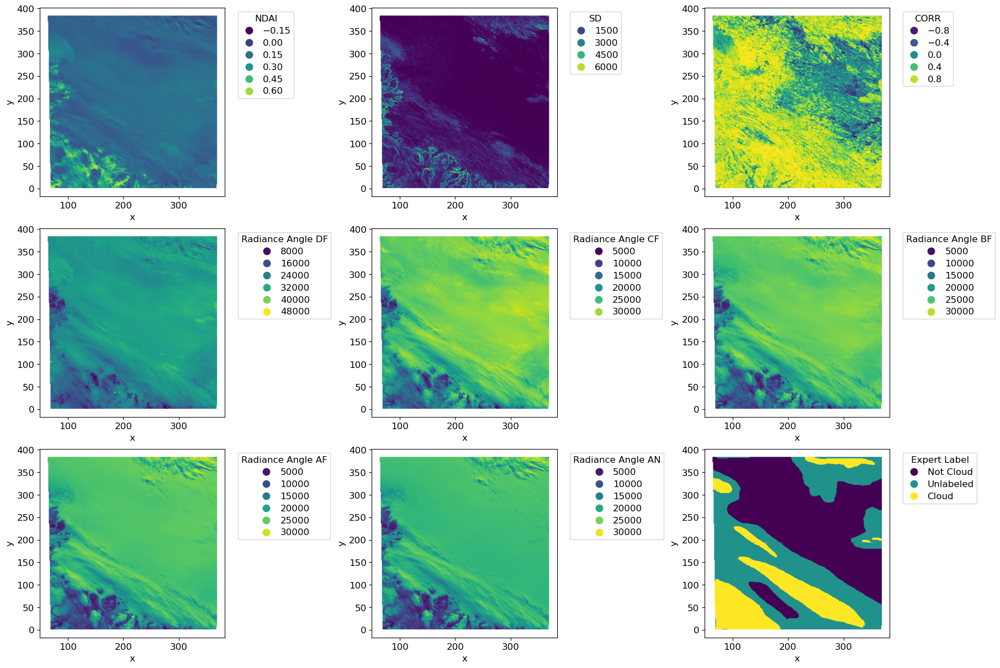

In [9]:
# focus on O013257 for these plots
# plot each feature from this image
fig, axes = plt.subplots(3, 3, figsize=(18, 12), constrained_layout=True)
axes = axes.flatten()
for i in range(len(labeled1.columns)):
    if i < 2:
        continue
    g = sns.scatterplot(data=labeled1, x='x', y='y', hue=labeled1.columns[i], marker='.', palette='viridis', s=7, linewidth=0, ax=axes[i-2])
    g.legend_.set_title(labeled1.columns[i])
    g.legend_.set_title("Cloud Label")
    handles, labels = g.get_legend_handles_labels()
    if labeled1.columns[i] == "Expert Label":
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, title=labeled1.columns[i], labels=["Not Cloud", "Unlabeled", "Cloud"], title_fontsize=12)
    else:
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title=labeled1.columns[i], title_fontsize=12)
    for lh in g.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 
    for text in g.legend_.get_texts():
            text.set_fontsize(12)  

    axes[i - 2].set_xlabel('x', fontsize=12)
    axes[i - 2].set_ylabel('y', fontsize=12)
    axes[i - 2].tick_params(axis='both', labelsize=12)  # Adjust axis tick size
plt.show()

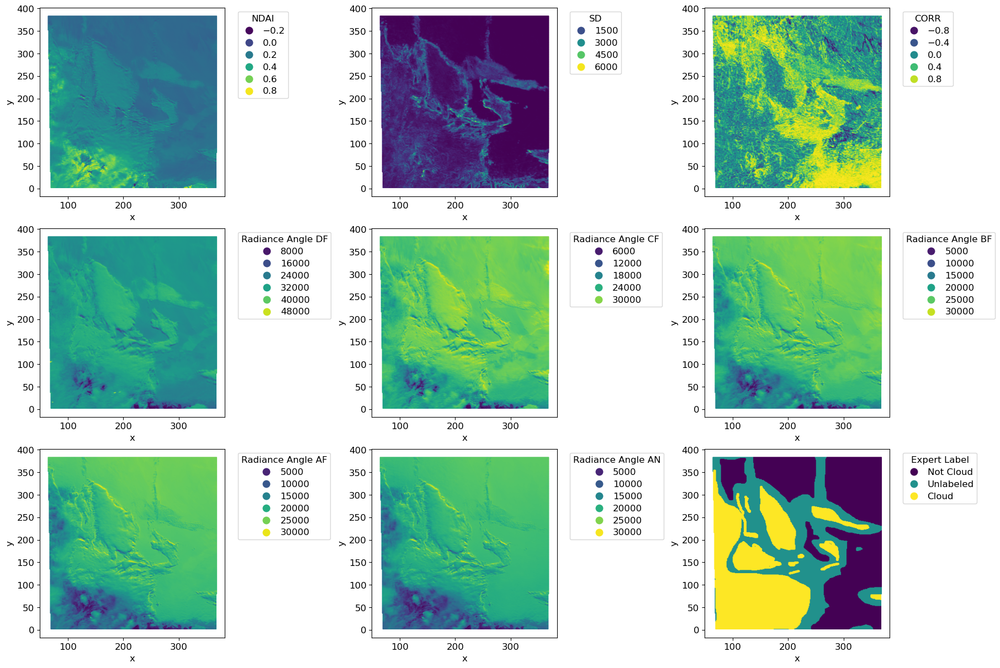

In [10]:
# focus on O013257 for these plots
# plot each feature from this image
fig, axes = plt.subplots(3, 3, figsize=(18, 12), constrained_layout=True)
axes = axes.flatten()
for i in range(len(labeled2.columns)):
    if i < 2:
        continue
    g = sns.scatterplot(data=labeled2, x='x', y='y', hue=labeled2.columns[i], marker='.', palette='viridis', s=7, linewidth=0, ax=axes[i-2])
    g.legend_.set_title(labeled2.columns[i])
    g.legend_.set_title("Cloud Label")
    handles, labels = g.get_legend_handles_labels()
    if labeled2.columns[i] == "Expert Label":
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, title=labeled2.columns[i], labels=["Not Cloud", "Unlabeled", "Cloud"], title_fontsize=12)
    else:
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title=labeled2.columns[i], title_fontsize=12)
    for lh in g.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 
    for text in g.legend_.get_texts():
            text.set_fontsize(12)  

    axes[i - 2].set_xlabel('x', fontsize=12)
    axes[i - 2].set_ylabel('y', fontsize=12)
    axes[i - 2].tick_params(axis='both', labelsize=12)  # Adjust axis tick size
plt.show()

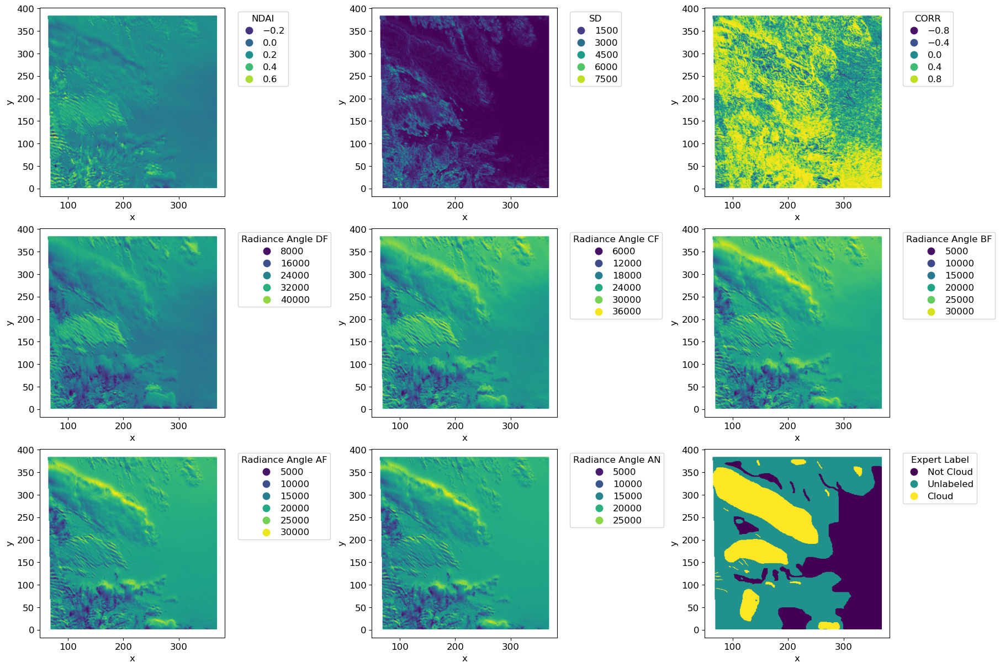

In [11]:
# plot each feature from this image
fig, axes = plt.subplots(3, 3, figsize=(18, 12), constrained_layout=True)
axes = axes.flatten()
for i in range(len(labeled3.columns)):
    if i < 2:
        continue
    g = sns.scatterplot(data=labeled3, x='x', y='y', hue=labeled3.columns[i], marker='.', palette='viridis', s=7, linewidth=0, ax=axes[i-2])
    g.legend_.set_title(labeled3.columns[i])
    g.legend_.set_title("Cloud Label")
    handles, labels = g.get_legend_handles_labels()
    if labeled3.columns[i] == "Expert Label":
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, title=labeled3.columns[i], labels=["Not Cloud", "Unlabeled", "Cloud"], title_fontsize=12)
    else:
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title=labeled3.columns[i], title_fontsize=12)
    for lh in g.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 
    for text in g.legend_.get_texts():
            text.set_fontsize(12)  

    axes[i - 2].set_xlabel('x', fontsize=12)
    axes[i - 2].set_ylabel('y', fontsize=12)
    axes[i - 2].tick_params(axis='both', labelsize=12)  # Adjust axis tick size
plt.show()

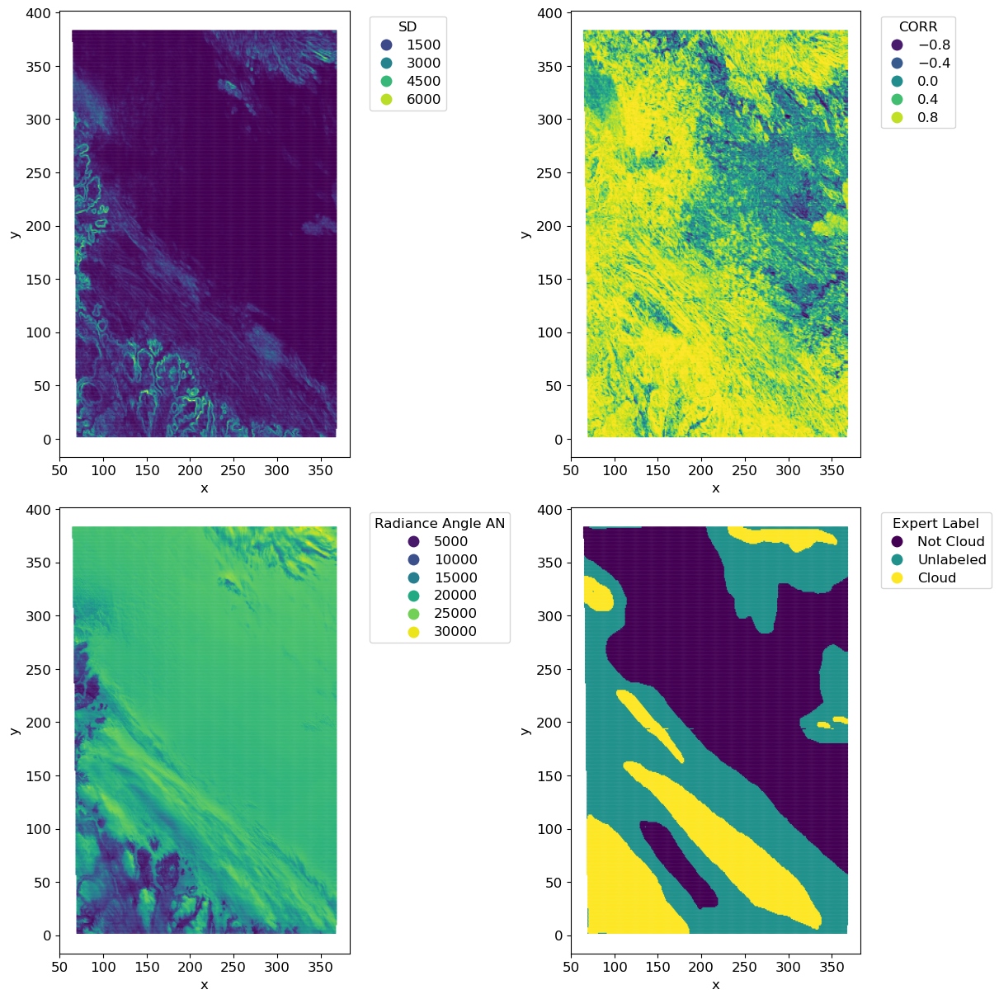

<Figure size 640x480 with 0 Axes>

In [12]:
# plot each feature from this image
fig, axes = plt.subplots(2, 2, figsize=(12, 12), constrained_layout=True)
axes = axes.flatten()
ax_num = 0
for i in [3, 4, 9, 10]:
    g = sns.scatterplot(data=labeled1, x='x', y='y', hue=labeled1.columns[i], marker='.', palette='viridis', s=7, linewidth=0, ax=axes[ax_num])
    g.legend_.set_title(labeled1.columns[i])
    g.legend_.set_title("Cloud Label")
    handles, labels = g.get_legend_handles_labels()
    if labeled1.columns[i] == "Expert Label":
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, title=labeled1.columns[i], labels=["Not Cloud", "Unlabeled", "Cloud"], title_fontsize=12)
    else:
        g.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title=labeled1.columns[i], title_fontsize=12)
    for lh in g.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 
    for text in g.legend_.get_texts():
            text.set_fontsize(12)  

    axes[ax_num].set_xlabel('x', fontsize=12)
    axes[ax_num].set_ylabel('y', fontsize=12)
    axes[ax_num].tick_params(axis='both', labelsize=12)  # Adjust axis tick size
    ax_num = ax_num + 1
plt.show()
plt.savefig('../figs/important_features.png');

<Axes: >

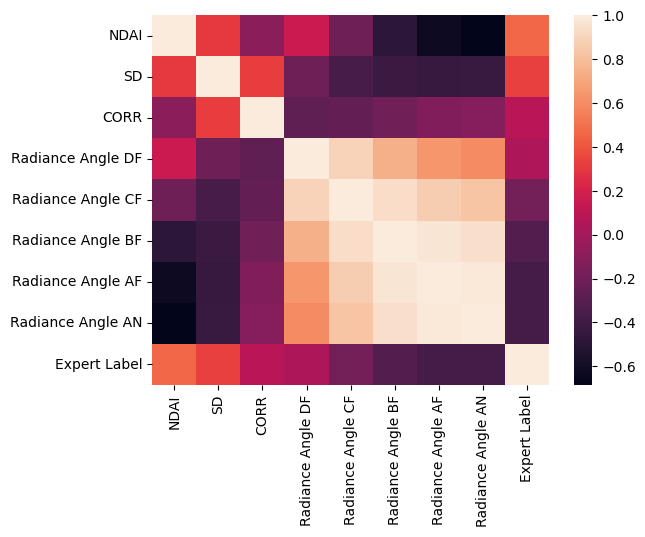

In [13]:
# correlation heatmap between the features (and the label)
correlations = image_data.corr()
sns.heatmap(correlations.iloc[2:, 2:], vmax=1., square=False)

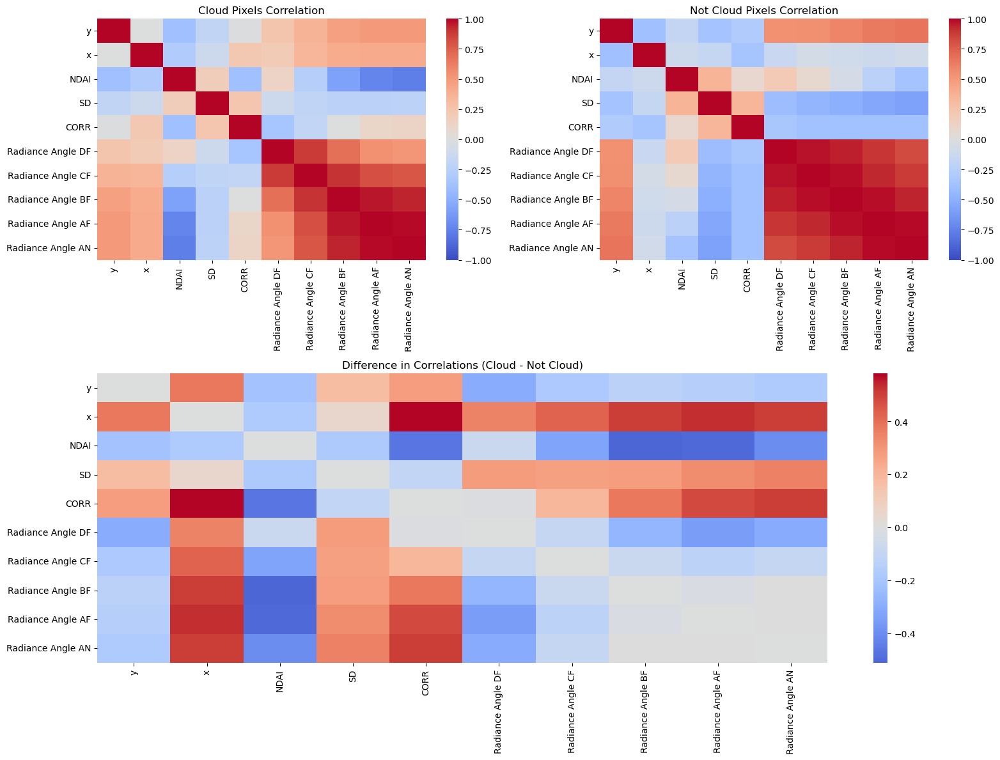

<Figure size 640x480 with 0 Axes>

In [14]:
import matplotlib.gridspec as gridspec

cloud_data = image_data[image_data["Expert Label"] == 1]
not_cloud_data = image_data[image_data["Expert Label"] == -1]
radiance_columns = [col for col in image_data.columns if col != "Expert Label"]
correlation_cloud = cloud_data[radiance_columns].corr()
correlation_not_cloud = not_cloud_data[radiance_columns].corr()
correlation_diff = correlation_cloud - correlation_not_cloud

fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1.2])
ax1 = fig.add_subplot(gs[0, 0])
sns.heatmap(correlation_cloud, ax=ax1, cmap="coolwarm", annot=False, vmax=1, vmin=-1)
ax1.set_title("Cloud Pixels Correlation")
ax2 = fig.add_subplot(gs[0, 1])
sns.heatmap(correlation_not_cloud, ax=ax2, cmap="coolwarm", annot=False, vmax=1, vmin=-1)
ax2.set_title("Not Cloud Pixels Correlation")

# Second row: full-width difference heatmap
ax3 = fig.add_subplot(gs[1, :])
sns.heatmap(correlation_diff, ax=ax3, cmap="coolwarm", annot=False, center=0)
ax3.set_title("Difference in Correlations (Cloud - Not Cloud)")

plt.tight_layout()
plt.show()
plt.savefig('../figs/cloudcorrelations.png');

In [15]:
# correlations between radiances
correlations.iloc[5:10, 5:10]

,Radiance Angle DF,Radiance Angle CF,Radiance Angle BF,Radiance Angle AF,Radiance Angle AN
Radiance Angle DF,1.000000,0.888178,0.741381,0.636452,0.596839
Radiance Angle CF,0.888178,1.000000,0.935858,0.863334,0.826039
Radiance Angle BF,0.741381,0.935858,1.000000,0.972266,0.942897
Radiance Angle AF,0.636452,0.863334,0.972266,1.000000,0.986521
Radiance Angle AN,0.596839,0.826039,0.942897,0.986521,1.000000


In [16]:
# correlation wrt label
correlations['Expert Label']

y                   -0.213344
x                   -0.465477
NDAI                 0.466840
SD                   0.328004
CORR                 0.079694
Radiance Angle DF    0.039090
Radiance Angle CF   -0.190372
Radiance Angle BF   -0.327379
Radiance Angle AF   -0.379099
Radiance Angle AN   -0.379072
Expert Label         1.000000
Name: Expert Label, dtype: float64

In [17]:
# check missing values
image_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 345005 entries, 0 to 114972
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   y                  345005 non-null  float64
 1   x                  345005 non-null  float64
 2   NDAI               345005 non-null  float64
 3   SD                 345005 non-null  float64
 4   CORR               345005 non-null  float64
 5   Radiance Angle DF  345005 non-null  float64
 6   Radiance Angle CF  345005 non-null  float64
 7   Radiance Angle BF  345005 non-null  float64
 8   Radiance Angle AF  345005 non-null  float64
 9   Radiance Angle AN  345005 non-null  float64
 10  Expert Label       345005 non-null  float64
dtypes: float64(11)
memory usage: 31.6 MB


In [18]:
image_data.describe()

,y,x,NDAI,SD,CORR,Radiance Angle DF,Radiance Angle CF,Radiance Angle BF,Radiance Angle AF,Radiance Angle AN,Expert Label
count,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000,345005.000000
mean,193.045443,217.895955,0.187572,591.668358,0.464002,27529.411195,25077.101970,22582.969798,20452.263583,18999.342919,-0.132610
std,110.274418,86.911772,0.096814,750.410181,0.392338,4576.050883,4458.922334,4424.135030,4307.260475,4005.152179,0.764449
min,2.000000,65.000000,-0.355057,13.329613,-0.942551,4904.000000,3536.750000,2777.750000,2170.500000,2089.250000,-1.000000
25%,98.000000,143.000000,0.128829,53.212029,0.160484,24954.500000,22371.250000,20216.750000,18798.250000,17700.500000,-1.000000
50%,193.000000,218.000000,0.161458,315.824890,0.534253,28552.250000,26387.500000,23791.250000,21443.250000,19921.500000,0.000000
75%,289.000000,293.000000,0.220603,832.616394,0.818286,30355.750000,28366.250000,25971.000000,23791.000000,21828.500000,0.000000
max,383.000000,368.000000,0.816864,8248.583008,0.983018,51807.125000,36623.750000,33268.250000,32085.000000,30824.500000,1.000000


In [19]:
# histogram for each feature
#for col in image_data.columns:
#    sns.histplot(data=image_data, x=col)
#    plt.title(col)
#    plt.show()

## 1.3. Data Cleaning and Splitting
For data cleaning, there were no missing values found. However there are pixels labeled as unsure. Since we do not have enough information to impute the values for the labels, we will leave the labels as unsure. However, those pixels will be removed when training the model. The labels will be converted to integers to ensure correct masking when filtering the data.

Splitting the data into training, validation, and test set using patches of the images. The pixels between the split images are not used to prevent data leakage.

In [20]:
def split_data(labeled1, labeled2, labeled3):
    """
    Splits the three labeled data into quadrants, resulting in 12 separate image files. 
    Then, splits them into training and testing data sets.
    
    args: labeled1: dataframe of the image file
          labeled2: dataframe of the image file
          labeled3: dataframe of the image file
    
    returns: a tuple containing two lists of dataframes containing image data
          
    """
    labeled1["Expert Label"] = labeled1["Expert Label"].astype('Int64')
    labeled2["Expert Label"] = labeled2["Expert Label"].astype('Int64')
    labeled3["Expert Label"] = labeled3["Expert Label"].astype('Int64')

    mid_y1 = labeled1["y"].median()
    mid_x1 = labeled1["x"].median()
    mid_y2 = labeled2["y"].median()
    mid_x2 = labeled2["x"].median()
    mid_y3 = labeled3["y"].median()
    mid_x3 = labeled3["x"].median()

    # split images into four
    bot_left_1 = (labeled1['y'] < mid_y1) & (labeled1['x'] < mid_x1)
    top_left_1 = (labeled1['y'] > mid_y1) & (labeled1['x'] < mid_x1)
    bot_right_1 = (labeled1['y'] < mid_y1) & (labeled1['x'] > mid_x1)
    top_right_1 = (labeled1['y'] > mid_y1) & (labeled1['x'] > mid_x1)

    labeled1_bl = labeled1[bot_left_1]
    labeled1_tl = labeled1[top_left_1]
    labeled1_br = labeled1[bot_right_1]
    labeled1_tr = labeled1[top_right_1]
    split_images1 = [labeled1_bl, labeled1_br, labeled1_tr]
    test1 = labeled1_tl

    # split images into four
    bot_left_2 = (labeled2['y'] < mid_y2) & (labeled2['x'] < mid_x2)
    top_left_2 = (labeled2['y'] >= mid_y2) & (labeled2['x'] < mid_x2)
    bot_right_2 = (labeled2['y'] < mid_y2) & (labeled2['x'] >= mid_x2)
    top_right_2 = (labeled2['y'] >= mid_y2) & (labeled2['x'] >= mid_x2)

    labeled2_bl = labeled2[bot_left_2]
    labeled2_tl = labeled2[top_left_2]
    labeled2_br = labeled2[bot_right_2]
    labeled2_tr = labeled2[top_right_2]
    split_images2 = [labeled2_bl, labeled2_tl, labeled2_tr]
    test2 = labeled2_br

    # split images into four
    bot_left_3 = (labeled3['y'] < mid_y3) & (labeled3['x'] < mid_x3)
    top_left_3 = (labeled3['y'] >= mid_y3) & (labeled3['x'] < mid_x3)
    bot_right_3 = (labeled3['y'] < mid_y3) & (labeled3['x'] >= mid_x3)
    top_right_3 = (labeled3['y'] >= mid_y3) & (labeled3['x'] >= mid_x3)

    labeled3_bl = labeled3[bot_left_3]
    labeled3_tl = labeled3[top_left_3]
    labeled3_br = labeled3[bot_right_3]
    labeled3_tr = labeled3[top_right_3]
    split_images3 = [labeled3_bl, labeled3_tl, labeled3_br]
    test3 = labeled3_tr

    split_images = split_images1
    split_images.extend(split_images2)
    split_images.extend(split_images3)
    test_images = [test1, test2, test3]

    return split_images, test_images

In [21]:
# train/test split
split_images, test_images = split_data(labeled1, labeled2, labeled3)

In [22]:
# data preprocessing
def clean_data(image):
    # get rid of unsure labels, convert no-cloud to 0
    clean_image = image.loc[image["Expert Label"] != 0]
    clean_image.loc[:, "Expert Label"] = clean_image.loc[:, "Expert Label"].replace({-1:0})
    return clean_image

clean_train_data = []
clean_test_data = []
for image in split_images:
    clean_train_data.append(clean_data(image))
for image in test_images:
    clean_train_data.append(clean_data(image))

train_image = pd.concat(clean_train_data)

In [23]:
def scale_features(image):
    # don't need x and y
    features = image.iloc[:, 2:10]
    labels = image.iloc[:, 10]
    # scale features, will not center since the data is positive, 0 has meaning
    normalized_features=features/features.std()

    return normalized_features, labels

### 2) Feature Engineering

#### 2.1 Feature Importance

The training data is used to train different tree based models and a logistic regression with L1 penalty to get the most important features. The most important features for this classification problem is "SD", "CORR", and "Radiance Angle AN".

In [24]:
# fit decision tree, get feature importance
X_train, y_train = scale_features(train_image)
DTC = DecisionTreeClassifier(criterion="gini", max_features=None, max_leaf_nodes=None, max_depth=None)
DTC.fit(X_train, y_train)
DTC.feature_importances_

array([0.0353035 , 0.69739571, 0.12614375, 0.02718763, 0.03012818,
       0.01947824, 0.02153762, 0.04282536])

In [25]:
# fit random forest, get feature importance
RF = RandomForestClassifier(criterion="gini", max_features=None, max_leaf_nodes=None, max_depth=4)
RF.fit(X_train, y_train)
RF.feature_importances_

array([1.46289694e-02, 8.34845138e-01, 1.21208781e-01, 1.90201151e-03,
       1.01326286e-04, 3.69064122e-05, 2.70158546e-05, 2.72498506e-02])

In [26]:
# fit gradient boosting classifier, get feature importance
XG = GradientBoostingClassifier(max_features=None, max_leaf_nodes=None)
XG.fit(X_train, y_train)
XG.feature_importances_

array([0.02129048, 0.80178704, 0.13184361, 0.00923782, 0.00289317,
       0.00116987, 0.00311631, 0.0286617 ])

In [27]:
# fit logistic regresion model, get coefficients
logreg = LogisticRegression(solver='saga', class_weight='balanced', max_iter=2000)
logreg.fit(X_train, y_train)
logreg.coef_

array([[-1.07731773,  1.1443349 ,  0.08729558,  3.65046375, -1.48082057,
        -2.05990668, -0.07752727, -0.70549324]])

In [28]:
# organize feature importances in Dataframe
dict = {'Decision Tree': DTC.feature_importances_, 'Random Forest': RF.feature_importances_, 'Gradient Boosting': XG.feature_importances_,
         "Logistic Regression": logreg.coef_[0]}

feature_imp = pd.DataFrame(data=dict, index = X_train.columns)
feature_imp_no_logreg = feature_imp.drop(labels="Logistic Regression", axis=1)


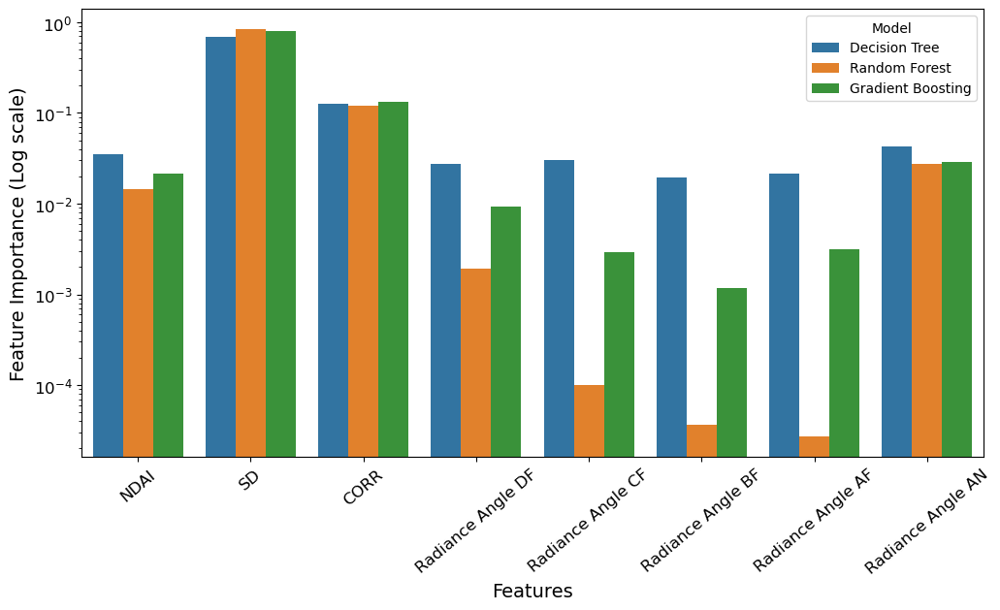

In [29]:
# Plot feature importances
feature_imp_melted = feature_imp_no_logreg.reset_index().melt(id_vars='index', var_name='Model', value_name='Importance')

plt.figure(figsize=(12, 6))
sns.barplot(data=feature_imp_melted, x='index', y='Importance', hue='Model')

plt.yscale('log')
plt.xticks(rotation=40, fontsize=12) 
plt.yticks(fontsize=12)  
plt.xlabel('Features', fontsize=14)  
plt.ylabel('Feature Importance (Log scale)', fontsize=14)  
plt.savefig('../figs/feature_importance.png');

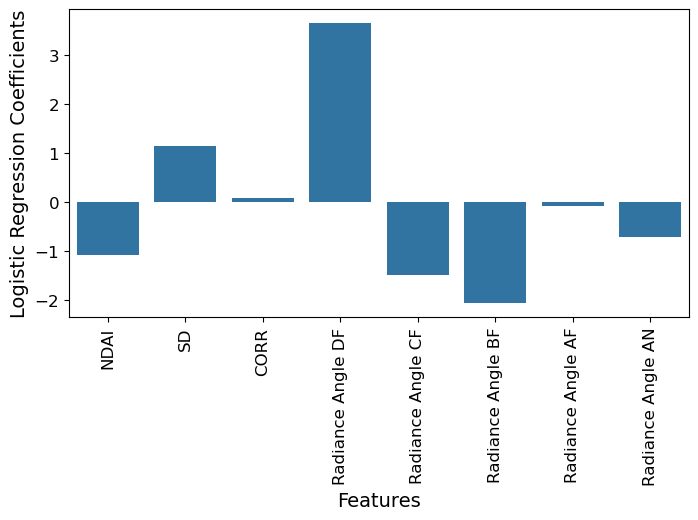

In [30]:
# plot logistic regression coefficients
plt.figure(figsize=(8, 4))
sns.barplot(data=feature_imp.reset_index(), x='index', y='Logistic Regression')

plt.xticks(rotation=90, fontsize=12)  
plt.yticks(fontsize=12)  
plt.xlabel('Features', fontsize=14)  
plt.ylabel('Logistic Regression Coefficients', fontsize=14)  
plt.savefig('../figs/logreg_coeff.png');

In [31]:
# rank features by importance
feature_rank = feature_imp.abs().rank(ascending=False)
feature_rank["Average"] = feature_rank.mean(axis=1)
feature_rank.sort_values("Average")

,Decision Tree,Random Forest,Gradient Boosting,Logistic Regression,Average
SD,1.0,1.0,1.0,4.0,1.75
CORR,2.0,2.0,2.0,7.0,3.25
Radiance Angle AN,3.0,3.0,3.0,6.0,3.75
NDAI,4.0,4.0,4.0,5.0,4.25
Radiance Angle DF,6.0,5.0,5.0,1.0,4.25
Radiance Angle CF,5.0,6.0,7.0,3.0,5.25
Radiance Angle BF,8.0,7.0,8.0,2.0,6.25
Radiance Angle AF,7.0,8.0,6.0,8.0,7.25


#### 2.2) Creating new features
"SD", "CORR", and "Radiance Angle AN" are the three most important features. So, for each pixel, we will take the average values of those features in the adjacent pixels and use them as new features.


In [ ]:
def add_feature(image_data, move_label=True):
    """
    Adds features that are the mean of the values from adjacent pixels

    args: image_data, pandas dataframe with image data
          move_label, if True, moves expert label to the first column
          
    returns: pandas dataframe with image data and the additional features
    
    """
    image_data = image_data.copy()
    image_data = image_data.sort_values(by=['y', 'x']).reset_index(drop=True)

    shifts = [
        (0, 1),    # up
        (0, -1),   # down
        (-1, 0),   # left
        (1, 0),    # right
        (-1, 1),   # top-left
        (1, 1),    # top-right
        (-1, -1),  # bottom-left
        (1, -1)    # bottom-right
    ]


    shifted_data = []

    for x_shift, y_shift in shifts:
        temp = image_data.copy()
        temp['x'] += x_shift
        temp['y'] += y_shift
        shifted_data.append(temp)

    
    neighbors = pd.concat(shifted_data)

    # merge all data on x and y so each row contains data of the neighbors
    merged = image_data.merge(neighbors, on=['x', 'y'], suffixes=('', '_adj'), how='left')

    # Group by coordinates and calculate average features of neighbors
    avg_features = merged.groupby(['x', 'y']).agg(
        avg_CORR=('CORR_adj', 'mean'),
        avg_AN=('Radiance Angle AN_adj', 'mean'),
        avg_SD=('SD_adj', 'mean')
    ).reset_index()

    # insert neighbor average to original data
    image_data = image_data.merge(avg_features, on=['x', 'y'], how='left')

    # if no adjacent pixel, just use own value
    image_data['avg_CORR'] = image_data['avg_CORR'].fillna(image_data['CORR'])
    image_data['avg_AN'] = image_data['avg_AN'].fillna(image_data['Radiance Angle AN'])
    image_data['avg_SD'] = image_data['avg_SD'].fillna(image_data['SD'])

    image_data.rename(columns={'avg_CORR': 'AVG CORR', 'avg_AN': 'AVG AN', 'avg_SD': 'AVG SD'}, inplace=True)

    # move expert label to front for easier indexing
    if move_label:
        first_column = image_data.pop('Expert Label')
        image_data.insert(0, 'Expert Label', first_column)

 
    return image_data

In [33]:
new_labeled1 = add_feature(labeled1)
new_labeled2 = add_feature(labeled2)
new_labeled3 = add_feature(labeled3)

#### 2.3) Transfer learning, use autoencoder

run autoencoder using: python run_autoencoder.py configs/default.yaml


get embeddings using: python get_embedding.py configs/test.yaml checkpoints/conv2d-epoch=049.ckpt

### 3) Modeling

#### 3.1) Training several models and assessing fit with cross validation

In [34]:
# add embedded features here
embedded_1 = pd.read_csv(f"image{image_numbers[0]}_ae.csv")
embedded_2 = pd.read_csv(f"image{image_numbers[1]}_ae.csv")
embedded_3 = pd.read_csv(f"image{image_numbers[2]}_ae.csv")

In [35]:
# merge to get full data
embed_labeled1 = new_labeled1.merge(embedded_1, on=['y', 'x'])
embed_labeled2 = new_labeled2.merge(embedded_2, on=['y', 'x'])
embed_labeled3 = new_labeled3.merge(embedded_3, on=['y', 'x'])

In [36]:
# split full data into train/test set
new_train_images, new_test_images = split_data(embed_labeled1, embed_labeled2, embed_labeled3)

In [37]:
# clean data
clean_train_data = []
clean_test_data = []
for image in new_train_images:
    clean_train_data.append(clean_data(image))
for image in new_test_images:
    clean_test_data.append(clean_data(image))


In [38]:
# three fold cross validation
# normalization not needed for trees
new_train1 = pd.concat(clean_train_data[:3])
new_train2 = pd.concat(clean_train_data[3:6])
new_train3 = pd.concat(clean_train_data[6:])
cv_images = [new_train1, new_train2, new_train3]
new_test = pd.concat(clean_test_data)

train_idx = list(combinations([0, 1, 2], 2))
indices = {0, 1, 2}
val_idx = [(indices - set(train_idx[0])).pop(), (indices - set(train_idx[1])).pop(), (indices - set(train_idx[2])).pop()]

In [39]:
# logistic regression cv, change L2 regularization strength
reg_strength_logreg = [1, .01, .001, .0001]
f1_logreg = []
f1_logreg_cv = []
for c in reg_strength_logreg:
    for i in range(len(train_idx)):
        train_data = pd.concat([cv_images[train_idx[i][0]], cv_images[train_idx[i][1]]])
        val_data = cv_images[val_idx[i]]
        
        X_train = train_data.iloc[:, 3:]
        y_train = train_data.iloc[:, 0]
        X_train = X_train/X_train.std()
        X_val = val_data.iloc[:, 3:]
        X_val = X_val/X_val.std()
        y_val = val_data.iloc[:, 0]
        logreg_cv = LogisticRegression(class_weight='balanced', max_iter=2000, C=c)
        logreg_cv.fit(X_train, y_train)
        y_pred = logreg_cv.predict(X_val)
        f1_logreg.append(f1_score(y_val, y_pred))
    f1_logreg_cv.append(sum(f1_logreg) / len(f1_logreg))
print(f1_logreg_cv)


[0.7576677516023841, 0.7788031976783207, 0.7907390789357737, 0.8095888680489708]


In [40]:
# Decision tree cv, vary max depth
f1_dtc = []
f1_dtc_cv = []
max_depth = [None, 64, 16]
for d in max_depth:
    for i in range(len(train_idx)):
        train_data = pd.concat([cv_images[train_idx[i][0]], cv_images[train_idx[i][1]]])
        val_data = cv_images[val_idx[i]]      
        X_train = train_data.iloc[:, 3:]
        y_train = train_data.iloc[:, 0]
        X_val = val_data.iloc[:, 3:]
        y_val = val_data.iloc[:, 0]
        DTC_CV = DecisionTreeClassifier(criterion="gini", max_features=None, max_leaf_nodes=None, max_depth=d, class_weight='balanced')

        DTC_CV.fit(X_train, y_train)
        y_pred = DTC_CV.predict(X_val)
        f1_dtc.append(accuracy_score(y_val, y_pred))
    f1_dtc_cv.append(sum(f1_dtc) / len(f1_dtc))
print(f1_dtc_cv)

[0.7591515888229302, 0.7572472722417855, 0.7587423637583254]


In [41]:
# Lightgbm, vary number of leaves
f1_lgb = []
f1_lgb_cv = []
num_leaves = [15, 31, 63] #default is 31

for n in num_leaves:
    for i in range(len(train_idx)):
        train_data = pd.concat([cv_images[train_idx[i][0]], cv_images[train_idx[i][1]]])
        val_data = cv_images[val_idx[i]]
        
        X_train = train_data.iloc[:, 3:]
        y_train = train_data.iloc[:, 0]
        
        X_val = val_data.iloc[:, 3:]
        
        y_val = val_data.iloc[:, 0]
        lgb_cv = lgb.LGBMClassifier(verbosity=-1, num_leaves=n, class_weight='balanced')
        lgb_cv.fit(X_train, y_train)
        y_pred = lgb_cv.predict(X_val)
        f1_lgb.append(f1_score(y_val, y_pred))
    f1_lgb_cv.append(sum(f1_lgb) / len(f1_lgb))
print(f1_lgb_cv)



[0.8660195728337005, 0.8688703082504122, 0.870359977466738]


#### 3.2) Choose best model

The LightGBM Classifier with 63 leaves had the best F1 score so it is chosen as our model to use moving forward.

In [42]:
# train LGBMClassifier using entire dataset
complete_train = pd.concat(cv_images)
X_train = complete_train.iloc[:, 3:]
y_train = complete_train.iloc[:, 0]
X_test = new_test.iloc[:, 3:]
y_test = new_test.iloc[:, 0]
lgb_final = lgb.LGBMClassifier(verbosity=-1, num_leaves=63, class_weight='balanced', eval_metric='logloss', early_stopping_rounds=20)

In [43]:
lgb_final.fit(X_train, y_train, eval_set=[(X_test, y_test)])

LGBMClassifier(class_weight='balanced', early_stopping_rounds=20,
               eval_metric='logloss', num_leaves=63, verbosity=-1)

In [44]:
# get predictions
y_pred = lgb_final.predict(X_test)

In [45]:
# various prediction scores (higher is better)
print("accuracy ", accuracy_score(y_test, y_pred))
print("f1 score ", f1_score(y_test, y_pred))
print("precision ", precision_score(y_test, y_pred)) # true positive / total predicted positive
print("recall ", recall_score(y_test, y_pred)) # true positive / total true positive

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
print("specificity ", specificity)
print("sensitivity ", sensitivity)

accuracy  0.9849885380462915
f1 score  0.9442460862400439
precision  0.913511359107214
recall  0.9771209322154327
specificity  0.9861651259164808
sensitivity  0.9771209322154327


In [46]:
# get loss over iterations
log_losses = lgb_final.evals_result_['valid_0']['binary_logloss']
iterations = len(log_losses)
df_logloss = pd.DataFrame({'Iteration': range(1, iterations+1), 'Log Loss': log_losses})

In [47]:
df_logloss

,Iteration,Log Loss
0,1,0.606687
1,2,0.535424
2,3,0.475000
3,4,0.423362
4,5,0.379693
...,...,...
89,90,0.043662
90,91,0.043733
91,92,0.043839
92,93,0.043851


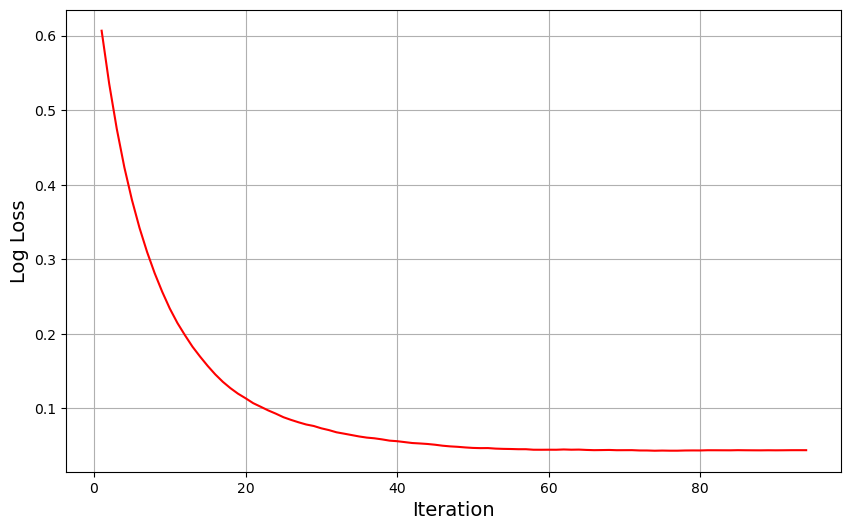

<Figure size 640x480 with 0 Axes>

In [48]:
# plot loss over iterations
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_logloss, x='Iteration', y='Log Loss', color='r')
plt.xlabel('Iteration', fontsize=14)
plt.ylabel('Log Loss', fontsize=14)
plt.grid(True)
plt.show()
plt.savefig('../figs/validation_loss_lgbm.png');

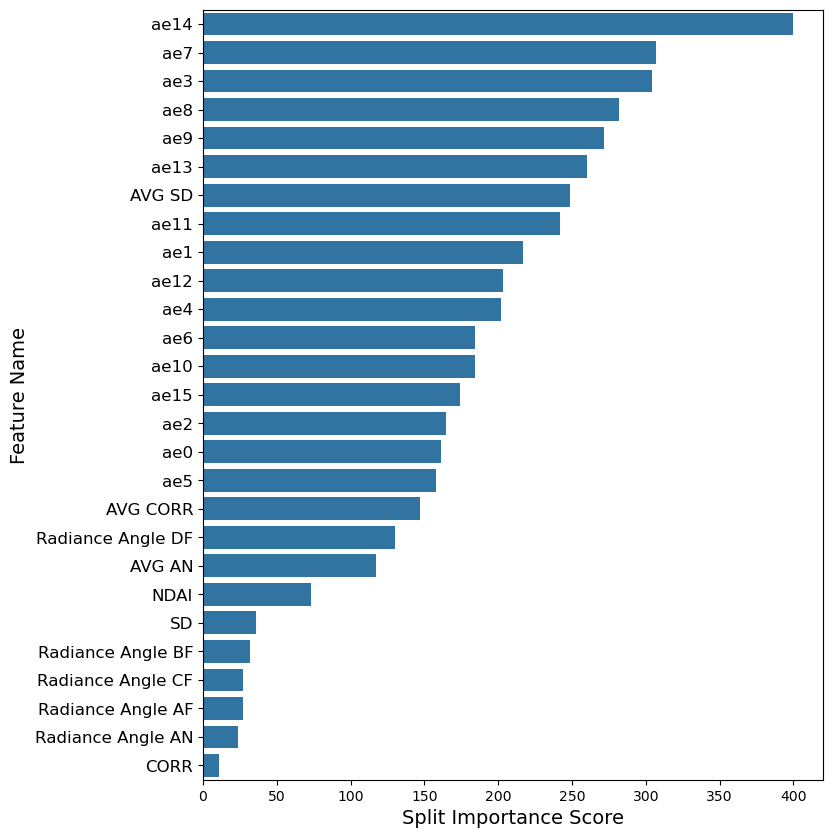

<Figure size 640x480 with 0 Axes>

In [49]:
# get feature importance, split importance
dict = {'Feature Importance': lgb_final.feature_importances_}
lgb_feature_imp = pd.DataFrame(data=dict, index = X_test.columns)
lgb_feature_imp["Feature Rank"] = lgb_feature_imp.rank(ascending=False)
lgb_feature_imp = lgb_feature_imp.sort_values("Feature Rank")
plt.figure(figsize=(8, 10))  # Set figure size
sns.barplot(data=lgb_feature_imp, y=lgb_feature_imp.index, x="Feature Importance")

plt.xlabel("Split Importance Score", fontsize=14)
plt.ylabel("Feature Name", fontsize=14)

plt.yticks(fontsize=12)
plt.show()
plt.savefig('../figs/lgbm_feature_imp.png');

#### 3.3) EDA on chosen prediction model

In [50]:
# clean test data for plotting
X_test1 = clean_test_data[0].iloc[:, 3:]
X_test2 = clean_test_data[1].iloc[:, 3:]
X_test3 = clean_test_data[2].iloc[:, 3:]
y_test1 = clean_test_data[0].iloc[:, 0]
y_test2 = clean_test_data[1].iloc[:, 0]
y_test3 = clean_test_data[2].iloc[:, 0]

In [51]:
clean_test_data[0].loc[:, "Predicted Label"] = lgb_final.predict(X_test1)
clean_test_data[1].loc[:, "Predicted Label"] = lgb_final.predict(X_test2)
clean_test_data[2].loc[:, "Predicted Label"] = lgb_final.predict(X_test3)


/tmp/ipykernel_169424/4100574520.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_test_data[0].loc[:, "Predicted Label"] = lgb_final.predict(X_test1)
/tmp/ipykernel_169424/4100574520.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_test_data[1].loc[:, "Predicted Label"] = lgb_final.predict(X_test2)
/tmp/ipykernel_169424/4100574520.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

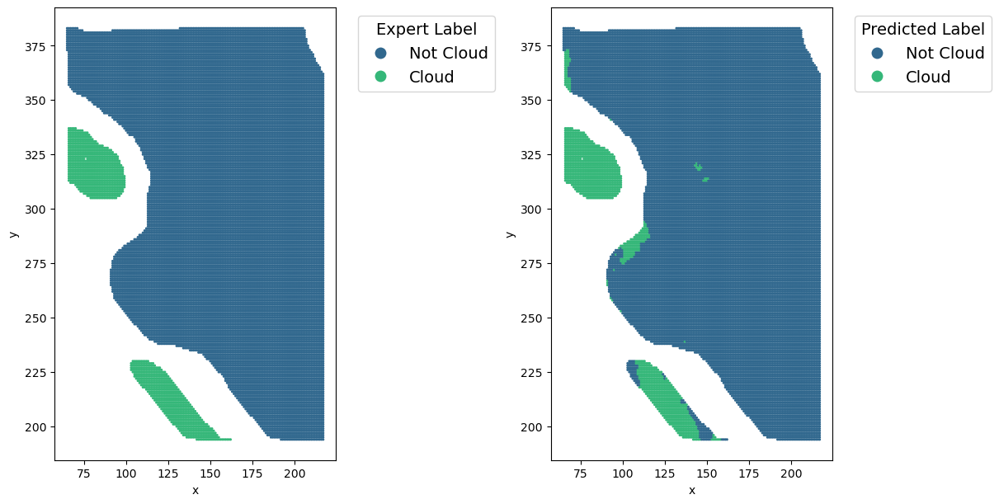

<Figure size 640x480 with 0 Axes>

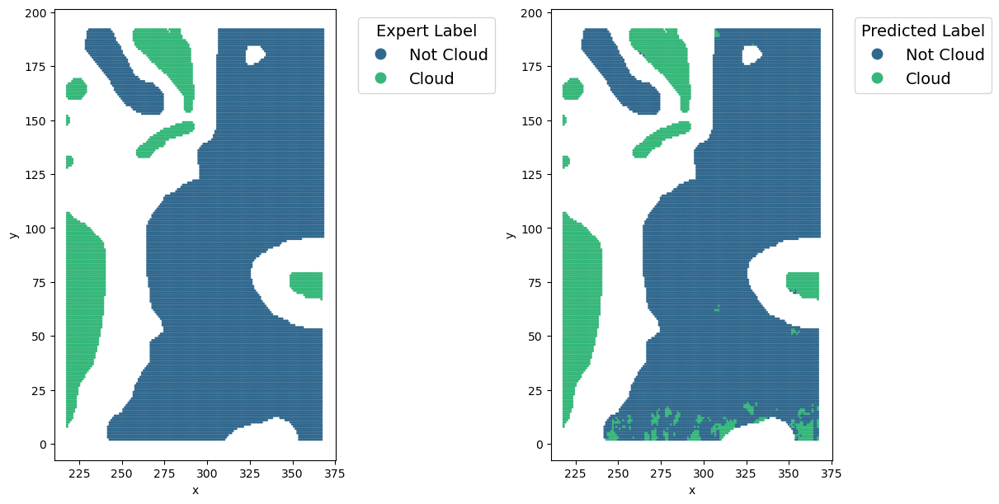

<Figure size 640x480 with 0 Axes>

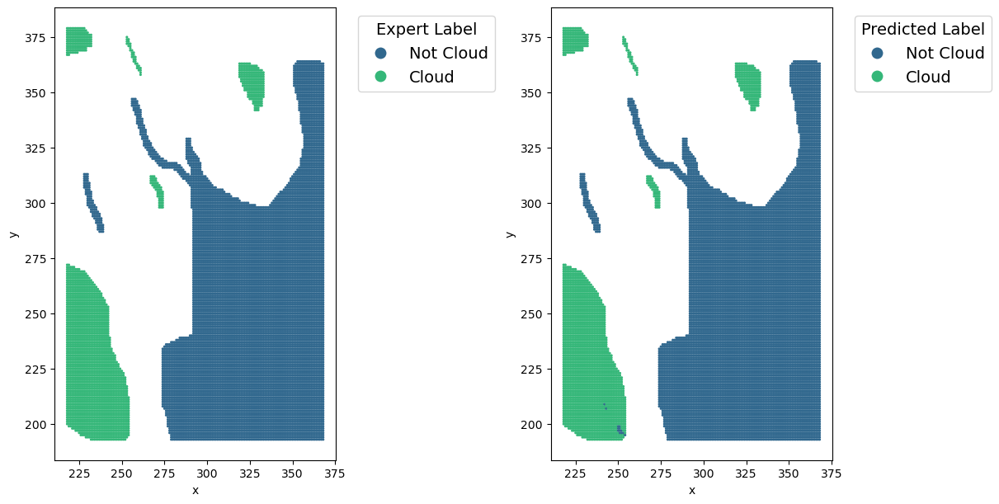

<Figure size 640x480 with 0 Axes>

In [52]:
# plot expert label and predicted label side by side
for i in range(len(clean_test_data)):
    data = clean_test_data[i]
    y_coor = data.iloc[:, 1].to_numpy()
    x_coor = data.iloc[:, 2].to_numpy()
    pred_label = data.iloc[:, -1].to_numpy()
    label = data.iloc[:, 0].to_numpy()
    df = pd.DataFrame(np.stack((y_coor, x_coor, label), axis=1))
    df.columns = ['y', 'x', 'label']
    df_pred = pd.DataFrame(np.stack((y_coor, x_coor, pred_label), axis=1))
    df_pred.columns = ['y', 'x', 'label']
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

    g1 = sns.scatterplot(data=df, x='x', y='y', hue='label', marker='.', palette='viridis', s=20, linewidth=0, ax=axes[0])
    g1.legend_.set_title("Cloud Label")
    handles, labels = g1.get_legend_handles_labels()
    g1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Cloud"], title="Expert Label", title_fontsize=14, fontsize=14)
    for lh in g1.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 

    g2 = sns.scatterplot(data=df_pred, x='x', y='y', hue='label', marker='.', palette='viridis', s=20, linewidth=0, ax=axes[1])
    g2.legend_.set_title("Cloud Label")
    handles, labels = g2.get_legend_handles_labels()
    g2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Cloud"], title="Predicted Label", title_fontsize=14, fontsize=14)
    for lh in g2.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 
    plt.show()
    plt.savefig(f'../figs/predicted_label{i+1}.png');

In [53]:
all_test_data = pd.concat(clean_test_data)

In [54]:
# get misclassified pixels
misclassified = all_test_data[all_test_data["Expert Label"] != all_test_data["Predicted Label"]]

In [55]:
# get correctly classified pixels
wellclassified = all_test_data[all_test_data["Expert Label"] == all_test_data["Predicted Label"]]

In [56]:
wellclassified.describe()

,Expert Label,y,x,NDAI,SD,CORR,Radiance Angle DF,Radiance Angle CF,Radiance Angle BF,Radiance Angle AF,...,ae7,ae8,ae9,ae10,ae11,ae12,ae13,ae14,ae15,Predicted Label
count,53280.0,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,...,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000,53280.000000
mean,0.129054,217.701483,246.224155,0.155704,209.400293,0.450149,27740.016370,26062.235413,23938.835879,21871.872023,...,1.111858,-0.497756,-0.925009,0.155326,2.189096,0.422959,-0.595092,-1.868691,-2.087801,0.129054
std,0.335263,104.555594,84.916687,0.052241,378.185310,0.402770,3124.964381,2947.857101,2834.962578,2677.380948,...,1.004454,0.802614,1.692912,0.380494,1.076638,0.484828,0.668737,1.305869,0.956249,0.335263
min,0.0,2.000000,65.000000,-0.032731,13.329613,-0.903488,4904.000000,3536.750000,2841.250000,2544.750000,...,-4.871005,-4.934984,-5.834731,-3.341384,-3.934033,-2.587004,-4.263757,-6.232773,-4.711306,0.000000
25%,0.0,137.000000,174.000000,0.124218,32.850853,0.138044,26145.500000,24572.500000,22494.437500,20573.250000,...,0.715216,-0.554247,-1.819942,0.048382,1.501069,0.160497,-1.018726,-3.101798,-2.758962,0.000000
50%,0.0,235.000000,263.000000,0.147284,61.732590,0.493375,28213.500000,26810.375000,24854.250000,22255.250000,...,1.218781,-0.287322,-1.288574,0.145171,2.412209,0.487391,-0.718083,-1.690524,-2.327431,0.000000
75%,0.0,300.000000,322.000000,0.171638,166.813221,0.829803,29569.750000,28068.250000,25878.750000,23915.500000,...,1.731708,-0.068104,-0.594984,0.247016,2.876580,0.761198,-0.217456,-0.794648,-1.460322,0.000000
max,1.0,383.000000,368.000000,0.693554,3990.274902,0.982818,40098.750000,35057.750000,31653.750000,29563.250000,...,3.978486,1.857458,9.727651,3.342218,4.911818,2.400382,7.247077,3.195424,3.247019,1.000000


In [57]:
misclassified.describe()

,Expert Label,y,x,NDAI,SD,CORR,Radiance Angle DF,Radiance Angle CF,Radiance Angle BF,Radiance Angle AF,...,ae7,ae8,ae9,ae10,ae11,ae12,ae13,ae14,ae15,Predicted Label
count,812.0,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,...,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000
mean,0.198276,130.690887,220.762315,0.211560,835.927874,0.818956,23168.315271,20964.281096,18712.990456,16859.492611,...,-0.772110,-1.701445,2.680317,0.037272,0.706782,-0.345934,0.463486,-1.000036,-0.926707,0.801724
std,0.398947,132.830058,103.530913,0.084035,752.213349,0.175908,6814.991981,6800.403897,6644.683507,6456.793651,...,1.607902,0.858739,2.853832,0.741185,1.523934,0.786551,1.556981,1.895372,1.309347,0.398947
min,0.0,2.000000,66.000000,0.016706,53.889328,-0.156053,5007.750000,3776.250000,3268.000000,2991.750000,...,-4.536362,-4.398053,-2.186046,-2.957973,-3.886158,-2.797586,-1.971984,-4.237634,-3.443217,0.000000
25%,0.0,8.000000,109.000000,0.139274,312.050873,0.790613,19358.187500,17412.000000,14896.875000,12704.937500,...,-1.747748,-2.104264,0.024071,-0.063373,-0.502249,-0.917522,-0.742312,-2.671014,-2.127229,1.000000
50%,0.0,18.000000,251.000000,0.207040,598.299103,0.877928,24066.500000,21663.625000,18598.500000,16428.750000,...,-0.702954,-1.715115,3.439848,0.153124,0.522174,-0.253191,0.284145,-0.310378,-0.742665,1.000000
75%,0.0,277.000000,311.250000,0.264552,1086.240387,0.924231,28853.000000,26657.375000,24884.187500,23076.250000,...,0.227266,-1.068945,4.798609,0.362089,2.255714,0.279365,0.948374,0.532930,-0.104609,1.000000
max,1.0,373.000000,367.000000,0.693426,4496.215820,0.978970,33568.250000,32495.250000,27351.250000,25356.000000,...,3.908598,0.279978,7.686626,1.955393,3.404693,0.904711,6.620952,3.161412,2.764684,1.000000


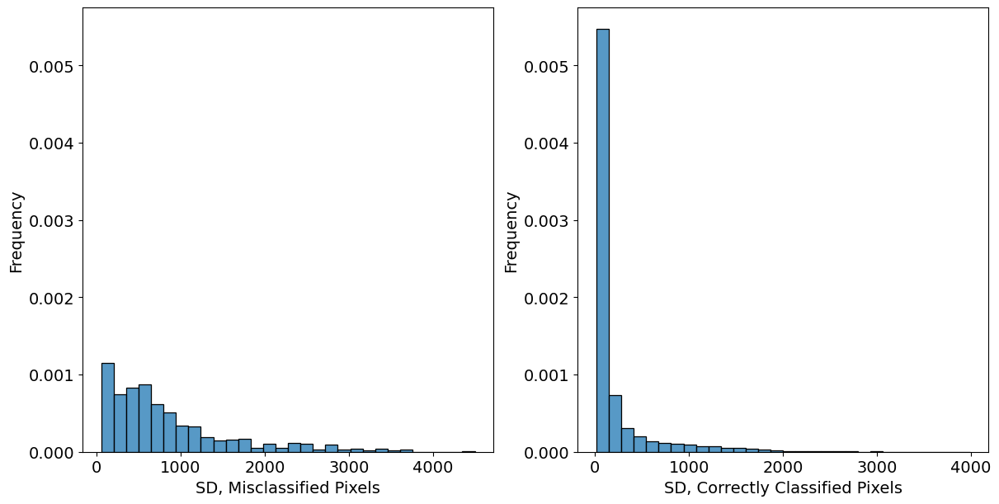

<Figure size 640x480 with 0 Axes>

In [58]:
# plot the three important features in the misclassified vs correctly classified pixels
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
sns.histplot(misclassified["SD"], bins = 30, ax=axes[0], stat="density")
axes[0].set_xlabel('SD, Misclassified Pixels', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)
axes[0].tick_params(axis='y', labelsize=14)
axes[0].tick_params(axis='x', labelsize=14)
sns.histplot(wellclassified["SD"], bins = 30, ax=axes[1], stat="density")
axes[1].set_xlabel('SD, Correctly Classified Pixels', fontsize=14)
axes[1].set_ylabel('Frequency', fontsize=14)
axes[1].tick_params(axis='y', labelsize=14)
axes[1].tick_params(axis='x', labelsize=14)
y_min = min(axes[0].get_ylim()[0], axes[1].get_ylim()[0])
y_max = max(axes[0].get_ylim()[1], axes[1].get_ylim()[1])

for ax in axes:
    ax.set_ylim(y_min, y_max)
plt.show()
plt.savefig(f'../figs/sd_hist.png');

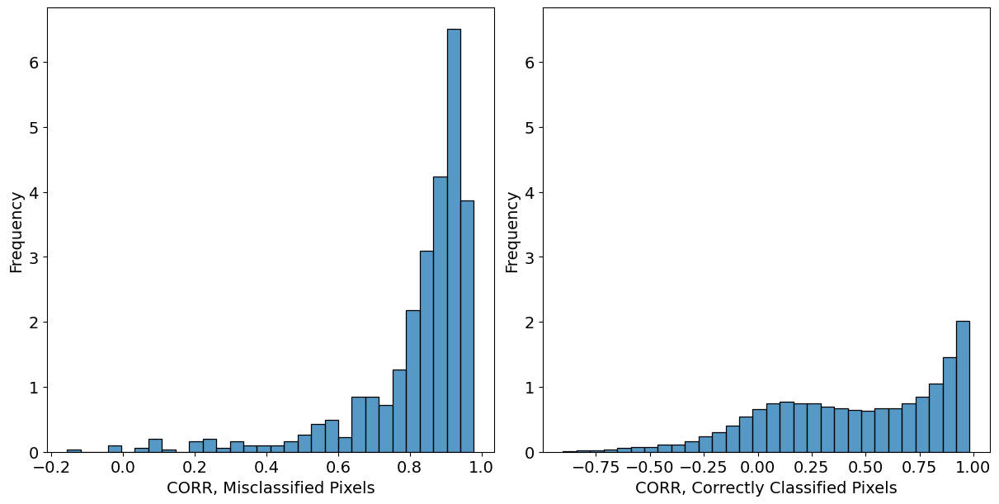

<Figure size 640x480 with 0 Axes>

In [59]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
sns.histplot(misclassified["CORR"], bins = 30, ax=axes[0], stat="density")
axes[0].set_xlabel('CORR, Misclassified Pixels', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)
axes[0].tick_params(axis='y', labelsize=14)
axes[0].tick_params(axis='x', labelsize=14)
sns.histplot(wellclassified["CORR"], bins = 30, ax=axes[1], stat="density")
axes[1].set_xlabel('CORR, Correctly Classified Pixels', fontsize=14)
axes[1].set_ylabel('Frequency', fontsize=14)
axes[1].tick_params(axis='y', labelsize=14)
axes[1].tick_params(axis='x', labelsize=14)
y_min = min(axes[0].get_ylim()[0], axes[1].get_ylim()[0])
y_max = max(axes[0].get_ylim()[1], axes[1].get_ylim()[1])



for ax in axes:
    ax.set_ylim(y_min, y_max)
plt.show()
plt.savefig(f'../figs/corr_hist.png');

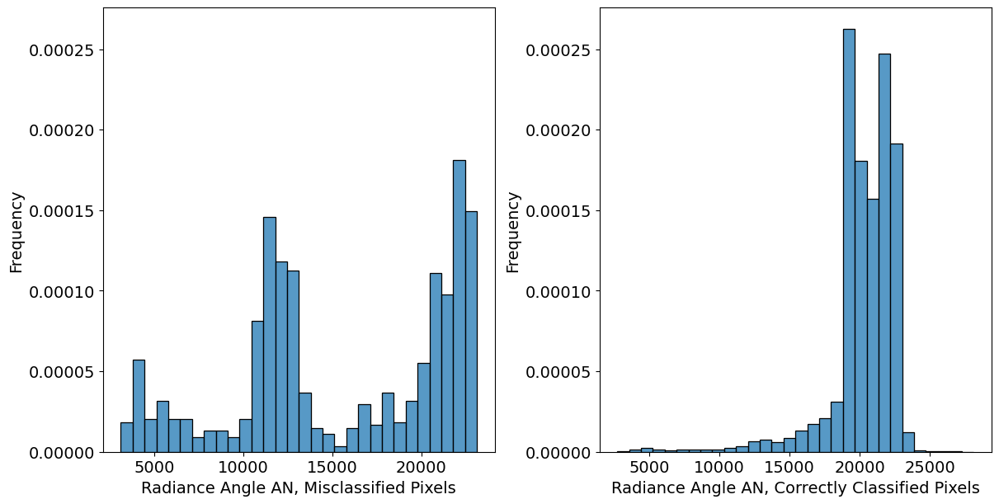

<Figure size 640x480 with 0 Axes>

In [60]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
sns.histplot(misclassified["Radiance Angle AN"], bins = 30, ax=axes[0], stat="density")
axes[0].set_xlabel('Radiance Angle AN, Misclassified Pixels', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)
axes[0].tick_params(axis='y', labelsize=14)
axes[0].tick_params(axis='x', labelsize=14)
sns.histplot(wellclassified["Radiance Angle AN"], bins = 30, ax=axes[1], stat="density")
axes[1].set_xlabel('Radiance Angle AN, Correctly Classified Pixels', fontsize=14)
axes[1].set_ylabel('Frequency', fontsize=14)
axes[1].tick_params(axis='y', labelsize=14)
axes[1].tick_params(axis='x', labelsize=14)
y_min = min(axes[0].get_ylim()[0], axes[1].get_ylim()[0])
y_max = max(axes[0].get_ylim()[1], axes[1].get_ylim()[1])

for ax in axes:
    ax.set_ylim(y_min, y_max)
plt.show()
plt.savefig(f'../figs/an_hist.png');

#### 3.4) Stability Check

In [61]:
# use different value fore num_leaves
lgb_stability = lgb.LGBMClassifier(verbosity=-1, num_leaves=31, class_weight='balanced', early_stopping_rounds=20) # uses logloss

In [62]:
lgb_stability.fit(X_train, y_train, eval_set=[(X_test, y_test)])

LGBMClassifier(class_weight='balanced', early_stopping_rounds=20, verbosity=-1)

In [63]:
lgb_stability_y = lgb_stability.predict(X_test)

In [64]:
print("accuracy ", accuracy_score(y_test, lgb_stability_y))
print("f1 score ", f1_score(y_test, lgb_stability_y))
print("precision ", precision_score(y_test, lgb_stability_y)) # true positive / total predicted positive
print("recall ", recall_score(y_test, lgb_stability_y)) # true positive / total true positive
tn, fp, fn, tp = confusion_matrix(y_test, lgb_stability_y).ravel()
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
print("specificity ", specificity)
print("sensitivity ", sensitivity)


accuracy  0.9846927456925239
f1 score  0.9432410200164518
precision  0.9111375976691829
recall  0.9776893562597698
specificity  0.9857400913824248
sensitivity  0.9776893562597698


In [65]:
# get feature importances
dict = {'Feature Importance': lgb_stability.feature_importances_}

lgb_feature_imp_stability = pd.DataFrame(data=dict, index = X_test.columns)
lgb_feature_imp_stability["Feature Rank (stability)"] = lgb_feature_imp_stability.rank(ascending=False)
lgb_feature_imp_stability = lgb_feature_imp_stability.sort_values("Feature Rank (stability)")

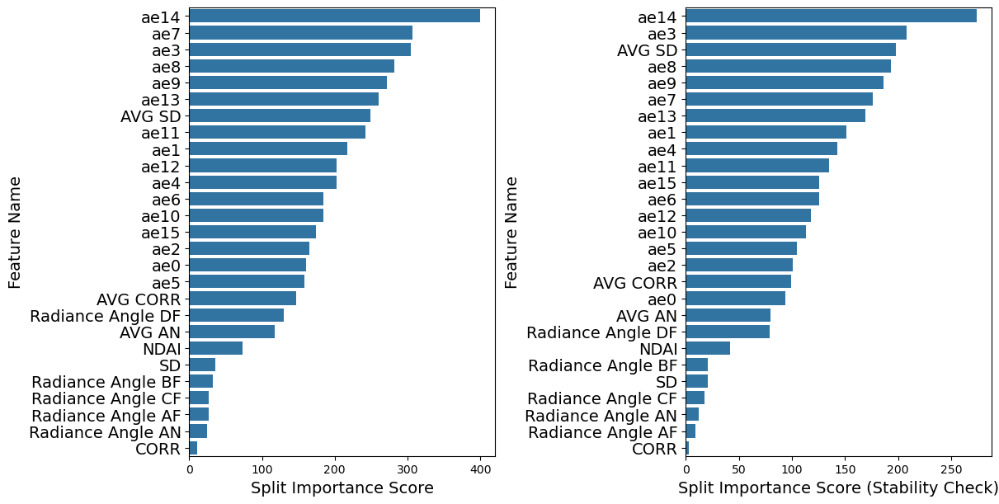

<Figure size 640x480 with 0 Axes>

In [66]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
sns.barplot(data=lgb_feature_imp, y=lgb_feature_imp.index, x="Feature Importance", ax=axes[0])
axes[0].set_xlabel("Split Importance Score", fontsize=14)
axes[0].set_ylabel("Feature Name", fontsize=14)
axes[0].tick_params(axis='y', labelsize=14)

sns.barplot(data=lgb_feature_imp_stability, y=lgb_feature_imp_stability.index, x="Feature Importance", ax=axes[1])
axes[1].set_xlabel("Split Importance Score (Stability Check)", fontsize=14)
axes[1].set_ylabel("Feature Name", fontsize=14)
axes[1].tick_params(axis='y', labelsize=14)

plt.show()
plt.savefig(f'../figs/stability_feature_imp.png');

In [67]:
# get data for one image
stability_test_data = clean_test_data[0]


In [68]:
# get predictions
stability_test_data.loc[:, "Predicted Label (stability)"] = lgb_stability.predict(X_test1)


/tmp/ipykernel_169424/3709785032.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stability_test_data.loc[:, "Predicted Label (stability)"] = lgb_stability.predict(X_test1)


/tmp/ipykernel_169424/813042167.py:16: UserWarning: Mismatched number of handles and labels: len(handles) = 2 len(labels) = 3
  g1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Unlabeled", "Cloud"], title="Predicted Label",  title_fontsize=14, fontsize=14)


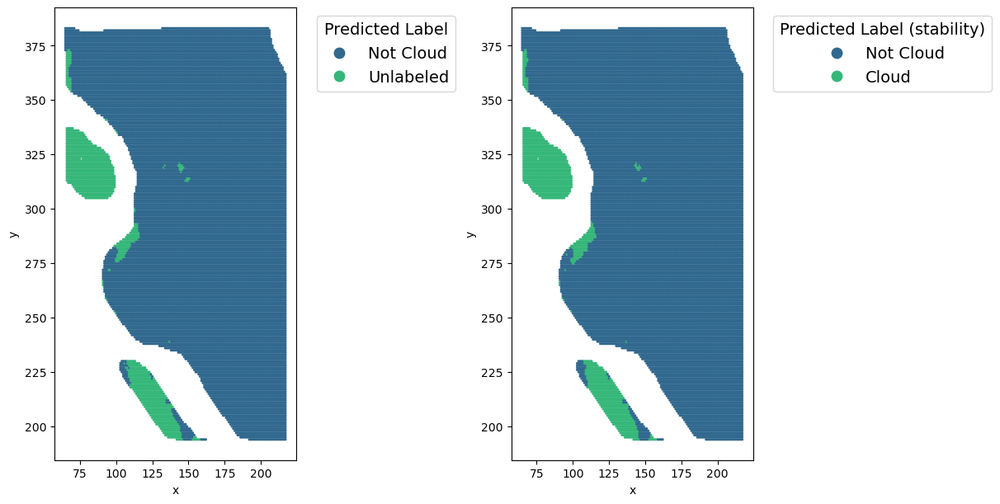

<Figure size 640x480 with 0 Axes>

In [69]:
# plot chosen model vs stability test model
data = stability_test_data
y_coor = data.iloc[:, 1].to_numpy()
x_coor = data.iloc[:, 2].to_numpy()
pred_label = data.iloc[:, -2].to_numpy()
label = data.iloc[:, -1].to_numpy()
df = pd.DataFrame(np.stack((y_coor, x_coor, label), axis=1))
df.columns = ['y', 'x', 'label']
df_pred = pd.DataFrame(np.stack((y_coor, x_coor, pred_label), axis=1))
df_pred.columns = ['y', 'x', 'label']
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

g1 = sns.scatterplot(data=df, x='x', y='y', hue='label', marker='.', palette='viridis', s=20, linewidth=0, ax=axes[0])
g1.legend_.set_title("Cloud Label")
handles, labels = g1.get_legend_handles_labels()
g1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Unlabeled", "Cloud"], title="Predicted Label",  title_fontsize=14, fontsize=14)
for lh in g1.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(20) 

g2 = sns.scatterplot(data=df_pred, x='x', y='y', hue='label', marker='.', palette='viridis', s=20, linewidth=0, ax=axes[1])
g2.legend_.set_title("Cloud Label")
handles, labels = g2.get_legend_handles_labels()
g2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Cloud"], title="Predicted Label (stability)", title_fontsize=14, fontsize=14)
for lh in g2.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(20) 

plt.show()
plt.savefig(f'../figs/stability_labels.png');

In [70]:
# test on unlabeled images
unlabeled_image_number = [41, 42]
unlabeled_paths = [all_filenames[unlabeled_image_number[0] - 1], all_filenames[unlabeled_image_number[1] - 1]]

In [71]:
# get unlabeled data in DataFrames
unlabeled_images = []
for fp in unlabeled_paths:
    npz_data = np.load(fp)
    key = list(npz_data.files)[0]
    data = npz_data[key]
    unlabeled_images.append(data)

unlabeled1 = pd.DataFrame(unlabeled_images[0])
unlabeled1.columns = ['y', 'x', 'NDAI', 'SD', 'CORR', 'Radiance Angle DF',
                      'Radiance Angle CF', 'Radiance Angle BF', 
                      'Radiance Angle AF', 'Radiance Angle AN']
unlabeled2 = pd.DataFrame(unlabeled_images[1])
unlabeled2.columns = ['y', 'x', 'NDAI', 'SD', 'CORR', 'Radiance Angle DF',
                      'Radiance Angle CF', 'Radiance Angle BF', 
                      'Radiance Angle AF', 'Radiance Angle AN']

In [72]:
# feature engineering
new_unlabeled1 = add_feature(unlabeled1, move_label=False)
new_unlabeled2 = add_feature(unlabeled2, move_label=False)
### add embedded features here
unlabeled_embedded_1 = pd.read_csv(f"image{unlabeled_image_number[0]}_ae.csv")
unlabeled_embedded_2 = pd.read_csv(f"image{unlabeled_image_number[1]}_ae.csv")
# merge
unlabeled_embedded_1 = new_unlabeled1.merge(embedded_1, on=['y', 'x'])
unlabeled_embedded_2 = new_unlabeled2.merge(embedded_2, on=['y', 'x'])

In [73]:
# get predictions
unlabeled_embedded_1.loc[:, "Predicted Label"] = lgb_final.predict(unlabeled_embedded_1.iloc[:, 2:])
unlabeled_embedded_2.loc[:, "Predicted Label"] = lgb_final.predict(unlabeled_embedded_2.iloc[:, 2:])
unlabeled_embedded = [unlabeled_embedded_1, unlabeled_embedded_2]

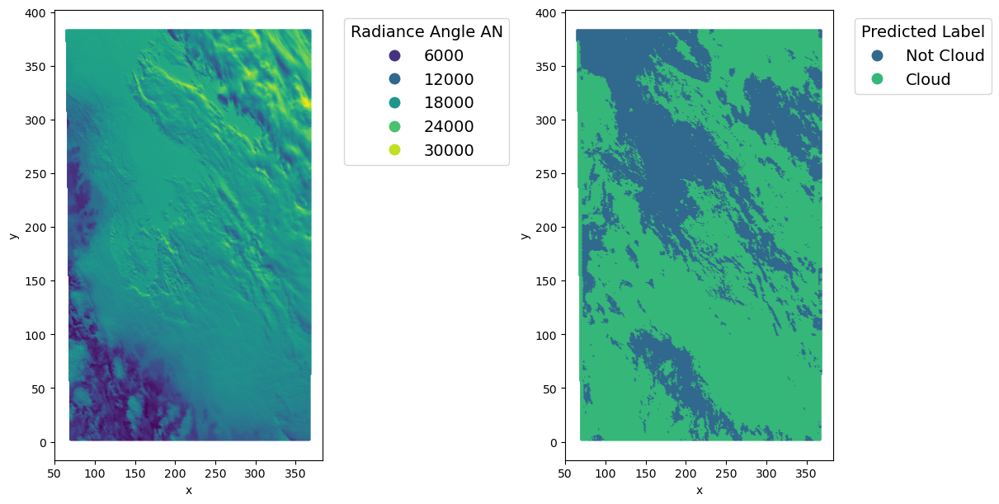

<Figure size 640x480 with 0 Axes>

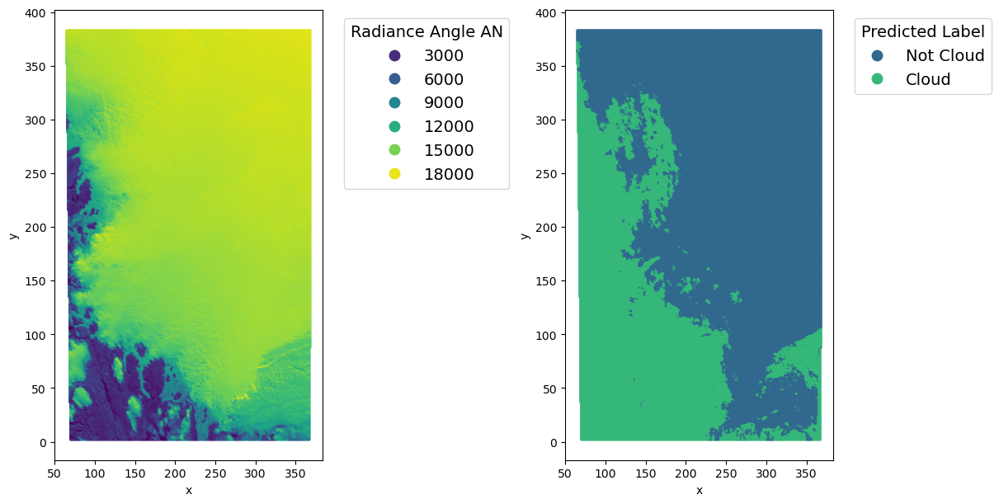

<Figure size 640x480 with 0 Axes>

In [74]:
# plot radiance AN vs predicted labels
for i in range(len(unlabeled_embedded)):
    data = unlabeled_embedded[i]
    y_coor = data.iloc[:, 0].to_numpy()
    x_coor = data.iloc[:, 1].to_numpy()
    pred_label = label = data.iloc[:, -1].to_numpy()
    rad_AN = data.iloc[:, 9].to_numpy()
    df = pd.DataFrame(np.stack((y_coor, x_coor, rad_AN), axis=1))
    df.columns = ['y', 'x', 'rad_AN']
    df_pred = pd.DataFrame(np.stack((y_coor, x_coor, pred_label), axis=1))
    df_pred.columns = ['y', 'x', 'label']
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

    g1 = sns.scatterplot(data=df, x='x', y='y', hue='rad_AN', marker='.', palette='viridis', s=20, linewidth=0, ax=axes[0])
    g1.legend_.set_title("Cloud Label")
    handles, labels = g1.get_legend_handles_labels()
    g1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, title="Radiance Angle AN", fontsize=14, title_fontsize=14)
    for lh in g1.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 

    g2 = sns.scatterplot(data=df_pred, x='x', y='y', hue='label', marker='.', palette='viridis', s=20, linewidth=0, ax=axes[1])
    g2.legend_.set_title("Cloud Label")
    handles, labels = g2.get_legend_handles_labels()
    g2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', handles=handles, labels=["Not Cloud", "Cloud"], title="Predicted Label", fontsize=14, title_fontsize=14)
    for lh in g2.legend_.legend_handles: 
        lh.set_alpha(1)
        lh.set_markersize(20) 
    plt.show()
    plt.savefig(f'../figs/unlabeled_predict{i+1}.png');

### Autoencoder test

In [75]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

labeled_images = np.array(['O012791.npz', 'O013257.npz', 'O013490.npz'])
orig_files = np.array([f.replace('../data/', '') for f in sorted(glob.glob('../data/*.npz'))])
ae_files = [f.replace('../data/', '') for f in glob.glob('../data/*.csv')]

display(
    np.where(orig_files == labeled_images[0])[0][0],
    np.where(orig_files == labeled_images[1])[0][0],
    np.where(orig_files == labeled_images[2])[0][0]
)
labeled_img1 = pd.DataFrame(np.load(f'../data/{labeled_images[0]}')['arr_0'])
labeled_img2 = pd.DataFrame(np.load(f'../data/{labeled_images[1]}')['arr_0'])
labeled_img3 = pd.DataFrame(np.load(f'../data/{labeled_images[2]}')['arr_0'])

ae_img1 = pd.read_csv('../data/image15_ae.csv')
ae_img2 = pd.read_csv('../data/image17_ae.csv')
ae_img3 = pd.read_csv('../data/image18_ae.csv')

ae_img1 = pd.concat([ae_img1, labeled_img1.iloc[:, 3:5], labeled_img1.iloc[:, 9], labeled_img1.iloc[:, -1]], axis=1).rename(columns = {10 : 'label'})
ae_img2 = pd.concat([ae_img2, labeled_img1.iloc[:, 3:5], labeled_img1.iloc[:, 9], labeled_img2.iloc[:, -1]], axis=1).rename(columns = {10 : 'label'})
ae_img3 = pd.concat([ae_img3, labeled_img1.iloc[:, 3:5], labeled_img1.iloc[:, 9], labeled_img3.iloc[:, -1]], axis=1).rename(columns = {10 : 'label'})

ae_img1.rename(columns={3 : 'SD', 4 : 'CORR', 9 : 'Radiance angle AN'}, inplace=True)
ae_img2.rename(columns={3 : 'SD', 4 : 'CORR', 9 : 'Radiance angle AN'}, inplace=True)
ae_img3.rename(columns={3 : 'SD', 4 : 'CORR', 9 : 'Radiance angle AN'}, inplace=True)

ae_img2.dropna(inplace=True)
ae_img3.dropna(inplace=True)
ae_img1.head(1)

np.int64(14)

np.int64(16)

np.int64(17)

,y,x,ae0,ae1,ae2,ae3,ae4,ae5,ae6,ae7,...,ae10,ae11,ae12,ae13,ae14,ae15,SD,CORR,Radiance angle AN,label
0,2.0,70.0,-1.814093,3.209972,-2.67061,-0.197401,2.73334,-2.526307,5.2724,-1.792283,...,-0.67217,-2.435381,-1.684352,7.670676,-1.456634,3.868947,1189.167114,-0.041079,17821.5,0.0


In [76]:
features = [
    'ae0', 'ae1', 'ae2', 'ae3', 'ae4', 'ae5', 'ae6', 'ae7', 
    'ae8', 'ae9', 'ae10', 'ae11', 'ae12', 'ae13', 'ae14', 'ae15',
    'SD', 'CORR', 'Radiance angle AN', 'x'
]

# REMOVE UNLABELED
X_train = pd.concat([ae_img1.iloc[:, :-1], ae_img2.iloc[:, :-1]], axis=0)[features]
y_train = pd.concat([ae_img1.iloc[:, -1], ae_img2.iloc[:, -1]], axis=0)

unlabeled_mask = y_train != 0
X_train = X_train[unlabeled_mask]
y_train = y_train[unlabeled_mask]

y_train[y_train == -1] = 0
y_train = y_train.astype(int)

X_val = ae_img3.iloc[:, :-1][features]
y_val = ae_img3.iloc[:, -1]

unlabeled_mask_val = y_val != 0
X_val = X_val[unlabeled_mask_val]
y_val = y_val[unlabeled_mask_val]

y_val[y_val == -1] = 0
y_val = y_val.astype(int)

In [77]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(max_iter=750)
logistic.fit(X_train, y_train)

y_pred = logistic.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
TN, FP, FN, TP = confusion_matrix(y_val, y_pred).ravel()

print(f'Accuracy: {accuracy}')
print(f'Precision: {TP / (TP + FP)}')
print(f'Recall: {TP / (TP + FN)}')

Accuracy: 0.9899907344191944
Precision: 0.9819180418317701
Recall: 0.9974524240185464


/home/yukiasa118/miniforge3/envs/stat214/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [78]:
from sklearn.tree import DecisionTreeClassifier

dec_tree = DecisionTreeClassifier()
dec_tree.fit(X_train, y_train)

y_pred = dec_tree.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
TN, FP, FN, TP = confusion_matrix(y_val, y_pred).ravel()

print(f'Accuracy: {accuracy}')
print(f'Precision: {TP / (TP + FP)}')
print(f'Recall: {TP / (TP + FN)}')

Accuracy: 0.9379084170486687
Precision: 0.9460461715240781
Recall: 0.9228848750413982


In [79]:
train_loss = pd.read_csv('../data/train_loss_wandb.csv')
val_loss = pd.read_csv('../data/val_loss_wandb.csv')
val_loss.head(1)

,trainer/global_step,default - _step,default - _step__MIN,default - _step__MAX,default - val_loss,default - val_loss__MIN,default - val_loss__MAX
0,1849,185,185,185,0.19284,0.19284,0.19284


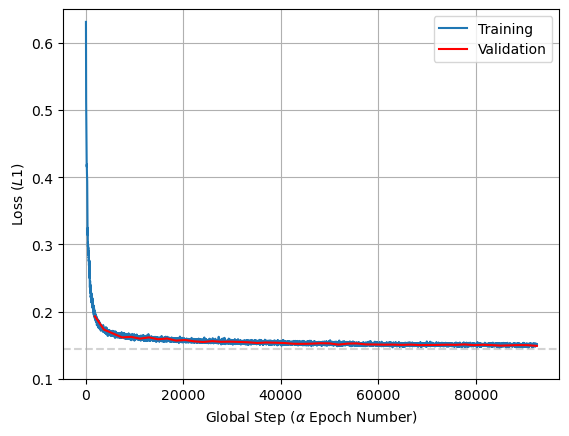

: 

In [ ]:
sns.lineplot(x=train_loss['trainer/global_step'], y=train_loss['default - train_loss'], label='Training')
sns.lineplot(x=val_loss['trainer/global_step'], y=val_loss['default - val_loss'], label='Validation', c='red')
plt.axhline(y = 0.144, color = 'darkgrey', linestyle = '--', alpha=0.5) 
plt.legend()
plt.ylim(0.1, 0.65)
#plt.title('Training & Validation Loss Decrease as Number of Epochs\nIncrease, But Return Eventually Diminishes')
plt.ylabel(r'Loss ($L1$)')
plt.xlabel(r'Global Step ($\alpha$ Epoch Number)')
plt.grid();

plt.savefig("../figs/train-val-loss-against-epochs.png")